In [1]:
# Importation des librairies
from netCDF4 import Dataset
import numpy as np
import os as os
from mpl_toolkits.basemap import Basemap
import matplotlib.patheffects as PathEffects
import itertools
from itertools import chain
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import pylab as p
from scipy.stats import skew, kurtosis
from matplotlib.transforms import Bbox
import sys
sys.path.insert(1, '../ERA')
from ERA_Fields import*

def create_mask(model, area, data):
    """
      This function allow to extract a subset of data encloses in the area.
      The output have the dimension of the area.
      If the area is cutted by the Grinwich meridian, a concatenation is required.
    """
    if model == "CESM":
        if area == "France":
            return np.concatenate((data[-51:-41, -3:],data[-51:-41, :6]), axis=1)
        elif area == "Scandinavia":
            return data[-36:-20, 4:32]
class Model_Field:
    def __init__(self, name, filename, label, Model, lat_start=0, lat_end=241, lon_start=0, lon_end=480):
        self.name = name    # Name inside the .nc file
        self.filename = filename # Name of the .nc file 
        self.label = label  # Label to be displayed on the graph
        self.var = []    
        self.lat_start = lat_start
        self.lat_end = lat_end
        self.lon_start = lon_start
        self.lon_end = lon_end
        self.time_start = time_start
        self.time_end = time_end
        self.Model = Model
    def load_field(self, folder):   # Load the year from the database
        dataset = Dataset(folder+self.filename+'.nc')
        self.time = np.asarray(dataset.variables['time'][:]).reshape(1000,-1)
        if self.name == 'Z3':
            self.var = dataset.variables[self.name][:,0,self.lat_start:self.lat_end,self.lon_start:self.lon_end]
        else:
            self.var = dataset.variables[self.name][:,self.lat_start:self.lat_end,self.lon_start:self.lon_end]
        self.var = np.logical_not(np.ma.getmask(self.var))*np.ma.getdata(self.var) # This statement is needed to set to 0 the points in the ocean that have mask = True
        print("input var.shape = ",self.var.shape)
        self.var = self.var.reshape(1000, self.var.shape[0]//1000, self.var.shape[1], self.var.shape[2])
        self.lon = dataset.variables["lon"][self.lon_start:self.lon_end]
        self.lat = dataset.variables["lat"][self.lat_start:self.lat_end]
        self.LON, self.LAT = np.meshgrid(self.lon, self.lat)
        print("output var.shape = ",self.var.shape)
        print("self.time.shape = ",self.time.shape)
        print(np.max(np.diff(self.time))," < np.diff(self.time) < ",np.min(np.diff(self.time)))
        dataset.close()
        
    def Greenwich(self, year, day):  # Take an array and copy the Greenwhich meridian to make sure we avoid a segment hole in basemap
        return np.append(self.var[year,day,:,:],np.transpose([self.var[year,day,:,0]]),axis = 1)
    
    def Set_area_integral(self, input_area, input_mask):   # Evaluate area integral
        self.abs_mask = np.zeros((self.var.shape[0],self.var.shape[1]))    # integral over the area
        for y in range(self.var.shape[0]):
            for i in range(self.var.shape[1]):
                self.abs_mask[y,i] = np.sum(np.sum(create_mask(self.Model,input_area,self.var[y,i,:,:])*input_mask))
        self.ano_abs_mask = self.abs_mask - np.mean(self.abs_mask,0)    # Evaluate grid-point climatological mean 
        anomaly_series = self.ano_abs_mask.copy()
        series = self.abs_mask.copy()
        return series, anomaly_series
                
Model = 'CESM'
area = 'Scandinavia'
lon_start = 0
lon_end = 288
lat_start = 192-192*60//180 # latitudes start from 90 degrees North Pole
lat_end = 192


Months1 = [0, 0, 0, 0, 0, 0, 31, 30, 31, 31, 30, 0, 0, 0] # Because of 3 day running mean we lose 2 days
Tot_Mon1 = list(itertools.accumulate(Months1))
time_start = Tot_Mon1[5]
time_end = Tot_Mon1[10]

t2m = Model_Field('TSA','TSA','Temperature', Model, lat_start, lat_end, lon_start, lon_end)
t2m.load_field('Data_CESM/North_Anomalies_')
zg500 = Model_Field('Z3','Z3.500hPa','500 mbar geopotential', Model, lat_start, lat_end, lon_start, lon_end)
zg500.load_field('Data_CESM/North_Anomalies_')

LON = t2m.LON
LAT = t2m.LAT

Trying to import basemap
Successfully imported basemap
input var.shape =  (153000, 64, 288)
output var.shape =  (1000, 153, 64, 288)
self.time.shape =  (1000, 153)
1.0000000000009095  < np.diff(self.time) <  0.9999999999999716
input var.shape =  (153000, 64, 288)
output var.shape =  (1000, 153, 64, 288)
self.time.shape =  (1000, 153)
1.0000000000009095  < np.diff(self.time) <  0.9999999999999716


/tmp/ipykernel_3943384/1123173019.py:16: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(width=coords[2],height=coords[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords[0],lon_0=coords[1])


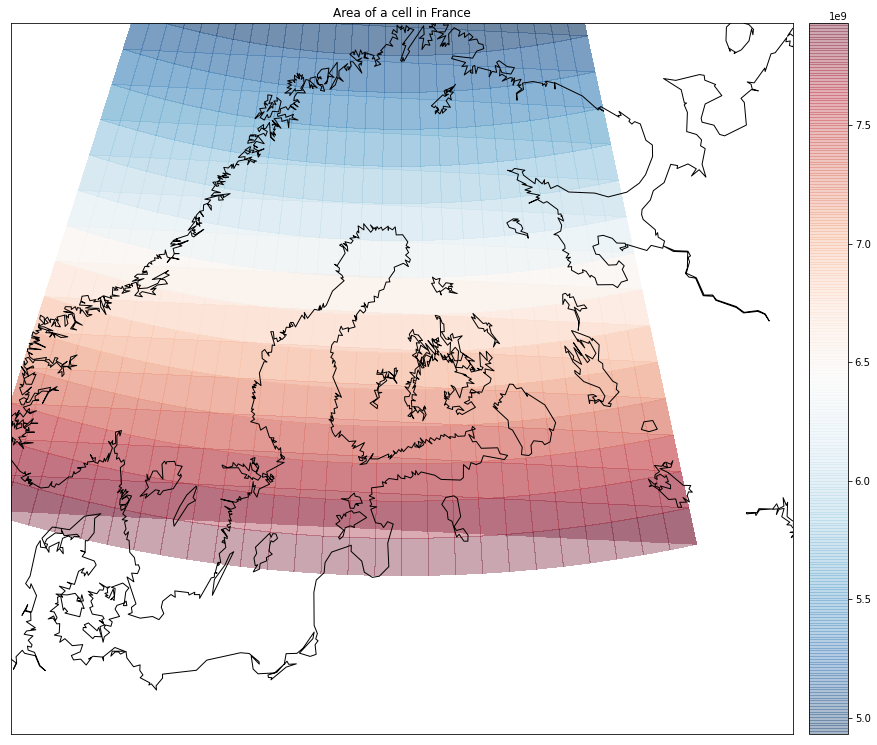

In [2]:
LON_mask = create_mask(Model,area,LON)
LAT_mask = create_mask(Model,area,LAT)
# Load the land area mask
dataset = Dataset('Data_CESM/CAM_landmask.nc')
lsm = dataset.variables['landmask'][lat_start:lat_end,lon_start:lon_end]
dataset.close()
# Load the areas of each cell
dataset = Dataset('Data_CESM/CAM_cellarea.nc')
cell_area = dataset.variables["cell_area"][lat_start:lat_end,lon_start:lon_end]
dataset.close()
mask_ocean = np.array(lsm)
mask_area = np.array(create_mask(Model,area, lsm))

coords = [62, 25., 2200000, 2000000]
fig = plt.figure(figsize=(15, 15), edgecolor='w')
m = Basemap(width=coords[2],height=coords[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords[0],lon_0=coords[1])
m.pcolormesh(Greenwich(LON_mask), Greenwich(LAT_mask), Greenwich(create_mask(Model,area,cell_area)), latlon=True, alpha = .35, cmap='RdBu_r')
plt.title("Area of a cell in France")
m.colorbar()
m.drawcoastlines()
plt.show()

/tmp/ipykernel_3943384/1969769661.py:3: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(width=coords[2],height=coords[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords[0],lon_0=coords[1])


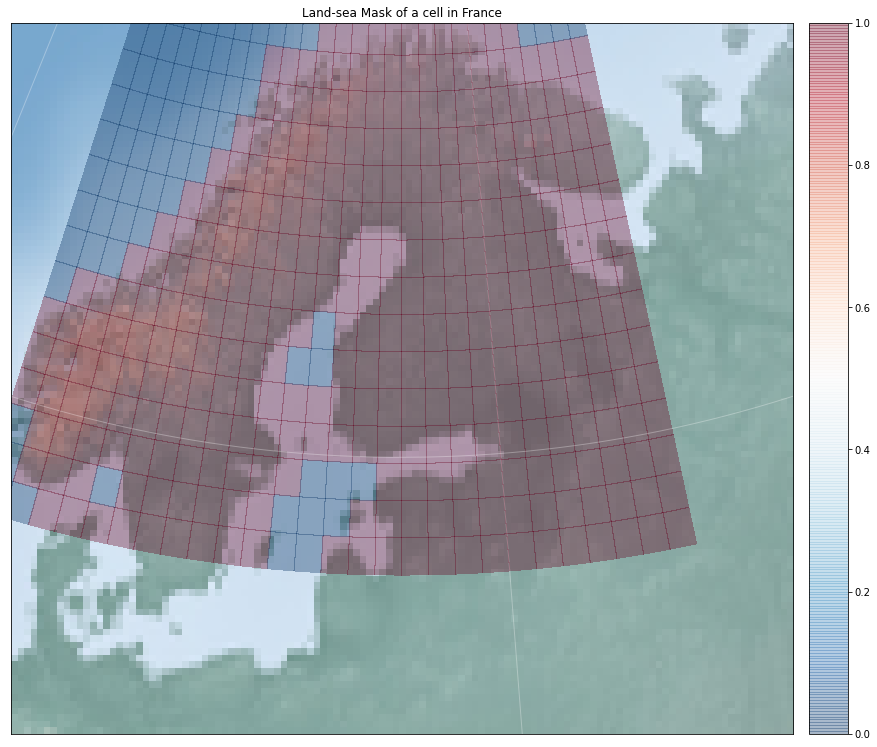

In [3]:
fig = plt.figure(figsize=(15, 15), edgecolor='w')
#m = Basemap(projection='nplaea',boundinglat=25,lon_0=0,resolution='c')
m = Basemap(width=coords[2],height=coords[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords[0],lon_0=coords[1])
draw_map(m)
m.pcolormesh((LON_mask), (LAT_mask), (create_mask(Model,area,lsm)), latlon=True, alpha = .35, cmap='RdBu_r')
plt.title("Land-sea Mask of a cell in France")
m.colorbar()
plt.show()

mylon =  6.25 , mylat =  44.764397 , mylon_coor =  -405340.7478881404 , mylat_coor =  -676483.3963148433
0


/tmp/ipykernel_3943384/3446524854.py:20: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(projection='nplaea',boundinglat=30,lon_0=0,resolution='c')


31
61
92


<Figure size 2880x2880 with 0 Axes>

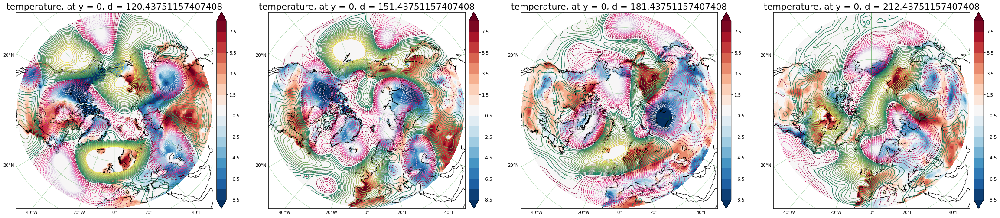

In [4]:
y = 0
mylon_pixel = 5
mylat_pixel = 15
mylon = LON[mylat_pixel, mylon_pixel]
mylat = LAT[mylat_pixel, mylon_pixel]
mylon_coor, mylat_coor = m(mylon, mylat)
print("mylon = ",mylon,", mylat = ",mylat, ", mylon_coor = ",mylon_coor, ", mylat_coor = ", mylat_coor)

t2m.levels = np.linspace(-8.5, 8.5, 18)  # Levels to be used when plotting
zg500.levels = np.concatenate((np.arange(-10 * 20, 0, 10), np.arange(10, 10 * 21, 10))) 
fig2 = plt.figure(figsize=(40, 40))
spec2 = gridspec.GridSpec(ncols=4, nrows=1, figure=fig2)
iterate = 0
ax = []
fig2 = plt.figure(figsize=(40, 10))
for i,subplt in zip(Tot_Mon1[5:9],['141','142','143','144']):
    ax.append(fig2.add_subplot(spec2[0,iterate]))
    iterate = iterate + 1
    print(i)
    m = Basemap(projection='nplaea',boundinglat=30,lon_0=0,resolution='c')
    geo_contourf(m, ax[iterate-1], 0, Greenwich(LON), Greenwich(LAT), Greenwich(t2m.var[y,i,:,:]), t2m.levels, "RdBu_r", "temperature, at y = " + str(y)+", d = "+str(t2m.time[y,i]))
    geo_contour(m, ax[iterate-1], 0, Greenwich(LON), Greenwich(LAT), Greenwich(zg500.var[y,i,:,:]), zg500.levels, "PuRd", "summer")
  

In [5]:
mask = create_mask(Model,area,cell_area)*create_mask(Model,area,lsm)  
mask = mask/np.sum(np.sum(mask))  # Here I combine both grid-point area times the mask into a normalized mask
print(mask[-1,:])

[0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0
 0.002049907949625275 0.002049907949625264 0.0020499079496252622
 0.0020499079496252687 0.0020499079496252687 0.00204990794962527 0.0 0.0
 0.0 0.0 0.0 0.0 0.0]


In [6]:
t2m.abs_area_int, t2m.ano_area_int = t2m.Set_area_integral(area,mask)
zg500.abs_area_int, zg500.ano_area_int = zg500.Set_area_integral(area,mask)

In [7]:
np.mean(t2m.abs_area_int[3,95:95+30])

4.097686593139853

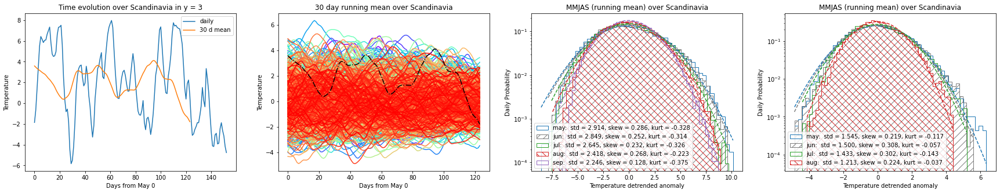

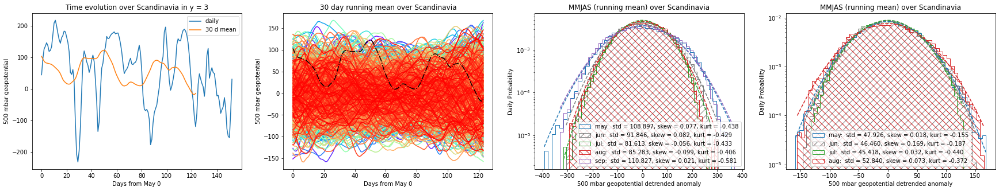

In [8]:
np.save('Postproc/'+Model+'_'+area+'_t2m', t2m.abs_area_int )
convseq = np.ones(30)/30
mycolors = ["tab:blue", "tab:gray", "tab:green", "tab:red", "tab:purple"]   # these colors are used to distinguish the months
monthhatches = ["","//","","\\\\",""]
mymonth = ["may", "jun", "jul", "aug", "sep"]
mylinewidth = [1, 1, 1, 1, 1]    # summer months should be more visible

for myfield in [t2m, zg500]:
    myyear = 3
    PltDistHist(myfield, convseq, mycolors, monthhatches, mymonth, mylinewidth, myyear, Tot_Mon1, area)

A.shape =  (1000, 79)
np.std(A) =  1.869373659570746
78 76


../ERA/ERA_Fields.py:792: UserWarning: a_max_and_ti_postproc: adjusting length
  warnings.warn('a_max_and_ti_postproc: adjusting length')
../ERA/ERA_Fields.py:764: RuntimeWarning: divide by zero encountered in log
  r1 = - 1/(np.log(1 - m/len(D_sorted))) # assumption of Poisson process


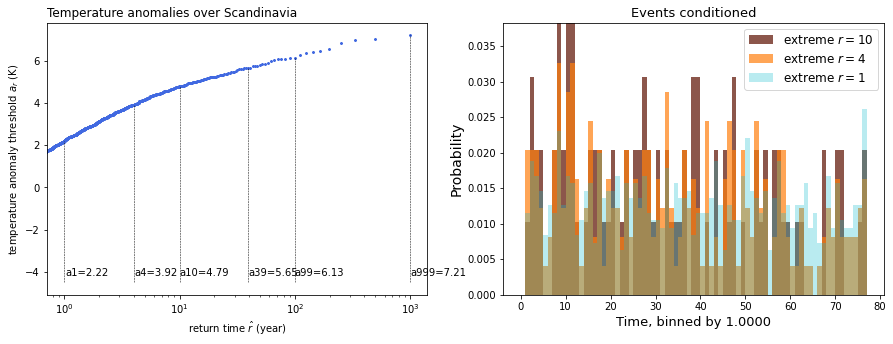

In [9]:
T=14
convseq = np.ones(T)/T
A = np.zeros((1000, Tot_Mon1[9] - Tot_Mon1[6] - T+1))   # When we use convolve (running mean) there is an extra point that we can generate by displacing the window hence 13 instead of 14
for y in range(1000):
    A[y,:]=np.convolve(t2m.abs_area_int[y,(Tot_Mon1[6]):(Tot_Mon1[9])],  convseq, mode='valid')
print("A.shape = ", A.shape)
print("np.std(A) = ",np.std(A))
A_max, Ti, year_a = a_max_and_ti_postproc(A, A.shape[1])
year_a = range(1000)
A_max_sorted = a_decrese(A_max, Ti, year_a)
np.save('Postproc/A_max_'+area+'_'+str(T),A_max)
XX_rt, YY_rt, xx_rt, yy_rt = return_time_fix(A_max_sorted,'yes')
print(np.max(Ti),90-14)
figure = plt.figure(1, figsize=(15, 5))
ax1 = figure.add_subplot(121)
Ax = figure.add_subplot(122)
PltReturnsHist(XX_rt, YY_rt, xx_rt, yy_rt, A_max_sorted, Tot_Mon1,area,ax1,Ax)

In [10]:
np.sum(np.array(A_max)>-np.inf), np.sum(np.array(A_max)>3.5), 1-65/1000

(1000, 308, 0.935)

A.shape = (100, 88)
A.shape = (100, 88)
A.shape = (100, 88)
A.shape = (100, 88)
A.shape = (100, 88)
A.shape = (100, 88)
A.shape = (100, 88)
A.shape = (100, 88)
A.shape = (100, 88)
A.shape = (100, 88)
A.shape = (100, 79)
A.shape = (100, 79)
A.shape = (100, 79)
A.shape = (100, 79)
A.shape = (100, 79)
A.shape = (100, 79)
A.shape = (100, 79)
A.shape = (100, 79)
A.shape = (100, 79)
A.shape = (100, 79)
A.shape = (100, 63)
A.shape = (100, 63)
A.shape = (100, 63)
A.shape = (100, 63)
A.shape = (100, 63)
A.shape = (100, 63)
A.shape = (100, 63)
A.shape = (100, 63)
A.shape = (100, 63)
A.shape = (100, 63)
A.shape = (100, 3)
A.shape = (100, 3)
A.shape = (100, 3)
A.shape = (100, 3)
A.shape = (100, 3)
A.shape = (100, 3)
A.shape = (100, 3)


../ERA/ERA_Fields.py:764: RuntimeWarning: divide by zero encountered in log
  r1 = - 1/(np.log(1 - m/len(D_sorted))) # assumption of Poisson process


A.shape = (100, 3)
A.shape = (100, 3)
A.shape = (100, 3)


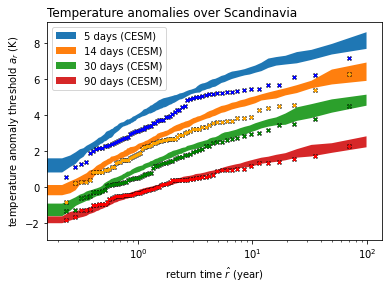

In [18]:
def BootstrapReturns(myseries,FROM, TO, Tot_Mon1,area, ax, Ts, modified='no', read_path='./', write_path='./'):
    # remove extra / from paths
    read_path = read_path.rstrip('/')
    write_path = write_path.rstrip('/')
    
    # Compare bootstrapped method (to be saved in "TO") to the points in "FROM"
    BootstrapReturnsOnly(myseries, TO, Tot_Mon1, area, ax, Ts, modified, write_path=write_path)
    for T, mycolor in zip(Ts,['blue','orange','green','red']):
        ERA_XX_rt = np.load(f'{read_path}/../ERA/Postproc/{FROM}_{area}_XX_rt_{T}.npy')
        ERA_YY_rt = np.load(f'{read_path}/../ERA/Postproc/{FROM}_{area}_YY_rt_{T}.npy')
        plt.scatter(ERA_XX_rt, ERA_YY_rt, s=15, marker='x', color='black')
        plt.scatter(ERA_XX_rt, ERA_YY_rt, s=7, marker='x', color=mycolor)#,label=str(T)+' days ('+FROM+')')
    ax.legend(loc='best')


figure = plt.figure(1, figsize=(6, 4))
ax = figure.add_subplot(111)
BootstrapReturns(t2m.abs_area_int,'ERA','CESM', Tot_Mon1,area, ax,[5,14,30,90],'yes')
ax.set_xlabel('return time $\hat{r}$ (year)')
ax.set_ylabel(r'temperature anomaly threshold $a_r$ (K)')
ax.set_title('')
figure.savefig('Images/Returns_'+Model+'_'+area+'.png',bbox_inches='tight', dpi=200)

(10, 92)
(92,) (92,)


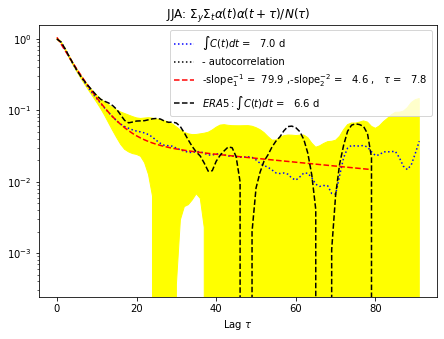

In [12]:
myfirst = [Tot_Mon1[6]]
mylast = [Tot_Mon1[9]]
myperiod_label = ['JJA']
myfiglabels = ['161']

figure = plt.figure(1, figsize=(50, 5))
for first, last, period_label, figlabels in zip(myfirst, mylast, myperiod_label, myfiglabels):
    autocorr = []
    for i in range(10):
        autocorr.append(autocorrelation(t2m.abs_area_int[i*100:(i+1)*100,first:last],last-first))
    autocorr = np.array(autocorr)/np.std(t2m.abs_area_int[i*100:(i+1)*100,first:last])**2
    print(autocorr.shape)
    autocorr_mean = np.mean(autocorr,0)
    autocorr_std = np.std(autocorr,0)
    np.save('Postproc/CESM_'+area+'_autocorr_mean_'+period_label,autocorr_mean)
    np.save('Postproc/CESM_'+area+'_autocorr_std_'+period_label,autocorr_std)
    print(autocorr_mean.shape,autocorr_std.shape)
    ax = plt.subplot(figlabels)
    plt.fill_between(np.arange(0, len(autocorr_mean)), autocorr_mean-autocorr_std, autocorr_mean+autocorr_std,color='yellow')
    PltAutocorrelationFit(autocorr_mean,autocorr_std,0,80, ax,period_label)    
    autocorr_ERA5 = np.load('../ERA/Postproc/ERA_'+area+'_auto_corr_'+period_label+'.npy')
    plt.plot(np.arange(0, len(autocorr_ERA5)), autocorr_ERA5,'k--', label=r'$ERA5: \int C(t) dt$ = %5.1f d'%(integrate.cumtrapz(np.array(autocorr_ERA5), range(len(autocorr_ERA5)), initial=0)[-1]))
    plt.legend()
    #extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    figure.savefig("Images/autocorelation_"+period_label+"_"+area+".png")#, bbox_inches=extent.expanded(1.3, 1.3))

(10, 92)
(92,) (92,)


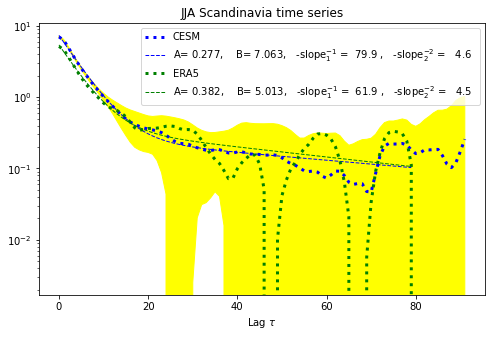

In [13]:
def PltAutocorrelationFit2(autocorr_mean,colors, linewidths, x1,x2, ax, Model):
    # Plot normalized Autocorrelation function
    plt.plot(np.arange(0, len(autocorr_mean)), autocorr_mean,colors[0], linewidth = linewidths[0], label=Model)#r'$\int C(t) dt$ = %5.1f d'%(integrate.cumtrapz(np.array(autocorr_mean), range(len(autocorr_mean)), initial=0)[-1]))
    #plt.plot(np.arange(0, len(autocorr_mean)), -autocorr_mean,'k:', label='- autocorrelation')
    
    popt1, pcov1 = curve_fit(func1, np.array(range(x1,x2)), autocorr_mean[x1:x2], p0=(1, 1e-6, 1, 1e-6))
    xaxis1 = np.arange(x1,x2)
    plt.plot(xaxis1, func1(xaxis1, *popt1), colors[1], linewidth = linewidths[1], label=r'A= %5.3f,$\quad$ B= %5.3f,$\quad$-slope$^{-1}_1$ = %5.1f ,$\quad$-slope$^{-2}_2$ = %5.1f  ' %(popt1[0],popt1[2],-popt1[1]**(-1),-popt1[3]**(-1)))
    plt.yscale("log")
    plt.xlabel(r"Lag $\tau$")



myfirst = [Tot_Mon1[6]]
mylast = [Tot_Mon1[9]]
myperiod_label = ['JJA']
myfiglabels = ['161']

figure = plt.figure(1, figsize=(8, 5))
for first, last, period_label, figlabels in zip(myfirst, mylast, myperiod_label, myfiglabels):
    autocorr = []
    for i in range(10):
        autocorr.append(autocorrelation(t2m.abs_area_int[i*100:(i+1)*100,first:last],last-first))
    autocorr = np.array(autocorr)#/np.std(t2m.abs_area_int[i*100:(i+1)*100,first:last])**2
    print(autocorr.shape)
    autocorr_mean = np.mean(autocorr,0)
    autocorr_std = np.std(autocorr,0)
    np.save('Postproc/Plasim_'+area+'_nonorm_autocorr_mean_'+period_label,autocorr_mean)
    np.save('Postproc/Plasim_'+area+'_nonorm_autocorr_std_'+period_label,autocorr_std)
    print(autocorr_mean.shape,autocorr_std.shape)
    plt.fill_between(np.arange(0, len(autocorr_mean)), autocorr_mean-autocorr_std, autocorr_mean+autocorr_std,color='yellow')
    autocorr_ERA5 = np.load('../ERA/Postproc/ERA_'+area+'_nonorm_auto_corr_'+period_label+'.npy')
    PltAutocorrelationFit2(autocorr_mean,['b:','b--'], [3, 1], 0,80,ax,Model)   
    PltAutocorrelationFit2(autocorr_ERA5,['g:','g--'], [3, 1],0,80,ax,'ERA5')   
    plt.legend()
    plt.title(period_label+" "+area+" time series")
    #extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    figure.savefig("Images/autocorelation_"+period_label+"_"+Model+"_"+area+".png")#, bbox_inches=extent.expanded(1.3, 1.3))

(10, 92)
(92,) (92,)


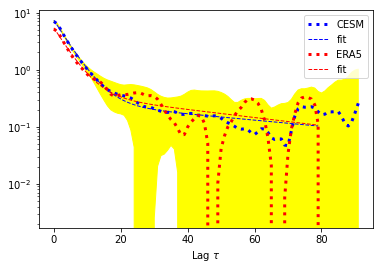

In [19]:
def PltAutocorrelationFit2(autocorr_mean,colors, linewidths, x1,x2, ax, Model):
    # Plot normalized Autocorrelation function
    plt.plot(np.arange(0, len(autocorr_mean)), autocorr_mean,colors[0], linewidth = linewidths[0], label=Model)#r'$\int C(t) dt$ = %5.1f d'%(integrate.cumtrapz(np.array(autocorr_mean), range(len(autocorr_mean)), initial=0)[-1]))
    #plt.plot(np.arange(0, len(autocorr_mean)), -autocorr_mean,'k:', label='- autocorrelation')
    
    popt1, pcov1 = curve_fit(func1, np.array(range(x1,x2)), autocorr_mean[x1:x2], p0=(1, 1e-6, 1, 1e-6))
    xaxis1 = np.arange(x1,x2)
    plt.plot(xaxis1, func1(xaxis1, *popt1), colors[1], linewidth = linewidths[1], label='fit')
    plt.yscale("log")
    plt.xlabel(r"Lag $\tau$")



myfirst = [Tot_Mon1[6]]
mylast = [Tot_Mon1[9]]
myperiod_label = ['JJA']
myfiglabels = ['161']

figure = plt.figure(1, figsize=(6, 4))
for first, last, period_label, figlabels in zip(myfirst, mylast, myperiod_label, myfiglabels):
    autocorr = []
    for i in range(10):
        autocorr.append(autocorrelation(t2m.abs_area_int[i*100:(i+1)*100,first:last],last-first))
    autocorr = np.array(autocorr)#/np.std(t2m.abs_area_int[i*100:(i+1)*100,first:last])**2
    print(autocorr.shape)
    autocorr_mean = np.mean(autocorr,0)
    autocorr_std = np.std(autocorr,0)
    np.save('Postproc/Plasim_'+area+'_nonorm_autocorr_mean_'+period_label,autocorr_mean)
    np.save('Postproc/Plasim_'+area+'_nonorm_autocorr_std_'+period_label,autocorr_std)
    print(autocorr_mean.shape,autocorr_std.shape)
    plt.fill_between(np.arange(0, len(autocorr_mean)), autocorr_mean-autocorr_std, autocorr_mean+autocorr_std,color='yellow')
    autocorr_ERA5 = np.load('../ERA/Postproc/ERA_'+area+'_nonorm_auto_corr_'+period_label+'.npy')
    PltAutocorrelationFit2(autocorr_mean,['b:','b--'], [3, 1], 0,80,ax,Model)   
    PltAutocorrelationFit2(autocorr_ERA5,['r:','r--'], [3, 1],0,80,ax,'ERA5')   
    plt.legend()
    #plt.title(period_label+" "+area+" time series")
    #extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    figure.savefig("Images/autocorelation_"+period_label+"_"+Model+"_"+area+".png",bbox_inches='tight', dpi=200)

In [14]:
return_index = 1
threshold = 3.5
for T in [14]:
    print("threshold = ",yy_rt[return_index], "return = ", xx_rt[return_index])
    for myfield in [t2m, zg500]:
        print(myfield.name)
        #CompComposites(t2m.abs_area_int, myfield, T, Tot_Mon1, 1)
        CompCompositesThreshold(t2m.abs_area_int, myfield, T, Tot_Mon1, threshold)
        np.save('Postproc/'+area+'_'+myfield.name+'_composite_mean_'+str(T),myfield.composite_mean)
        np.save('Postproc/'+area+'_'+myfield.name+'_composite_std_'+str(T),myfield.composite_std)
        np.save('Postproc/'+area+'_'+myfield.name+'_composite_t_'+str(T),myfield.composite_t)

threshold =  3.915851937343103 return =  4.004096461174296
TSA
A.shape =  (1000, 79)
A_max[0] = 5.142141080951551, Ti[0] = 43
A_max[2] = 3.6861594103862303, Ti[2] = 78
A_max[3] = 5.649616516863484, Ti[3] = 75
A_max[7] = 6.289419235962555, Ti[7] = 3
A_max[15] = 5.74053380941174, Ti[15] = 28
A_max[20] = 4.311308675874531, Ti[20] = 78
A_max[21] = 6.996556006562259, Ti[21] = 39
A_max[26] = 3.882606118928044, Ti[26] = 64
A_max[27] = 4.178438073382989, Ti[27] = 8
A_max[30] = 3.729645186841504, Ti[30] = 16
A_max[38] = 4.620883151738652, Ti[38] = 31
A_max[44] = 4.786965611976381, Ti[44] = 56
A_max[50] = 3.974349338932001, Ti[50] = 7
A_max[64] = 3.516238213329976, Ti[64] = 55
A_max[69] = 4.6590905400583384, Ti[69] = 63
A_max[71] = 5.633196437575645, Ti[71] = 62
A_max[75] = 4.936345689983402, Ti[75] = 78
A_max[76] = 5.135384790735117, Ti[76] = 34
A_max[77] = 4.633634285741334, Ti[77] = 41
A_max[80] = 4.88562342624823, Ti[80] = 22
A_max[81] = 3.6224406952104258, Ti[81] = 23
A_max[82] = 3.95181053

../ERA/ERA_Fields.py:792: UserWarning: a_max_and_ti_postproc: adjusting length
  warnings.warn('a_max_and_ti_postproc: adjusting length')


A_max[177] = 4.988366207432725, Ti[177] = 14
A_max[179] = 3.6213136800439183, Ti[179] = 50
A_max[185] = 4.27386957228279, Ti[185] = 46
A_max[188] = 4.133908641208783, Ti[188] = 28
A_max[200] = 4.205065648111228, Ti[200] = 57
A_max[202] = 4.679448875433497, Ti[202] = 51
A_max[204] = 3.960223722155128, Ti[204] = 12
A_max[205] = 4.754876295952449, Ti[205] = 28
A_max[206] = 4.9666123853751625, Ti[206] = 25
A_max[212] = 4.808375949175942, Ti[212] = 19
A_max[225] = 6.416364581396379, Ti[225] = 7
A_max[226] = 4.728707790398522, Ti[226] = 52
A_max[228] = 4.32793963551505, Ti[228] = 31
A_max[230] = 5.351073798023543, Ti[230] = 36
A_max[231] = 5.3382282364107905, Ti[231] = 49
A_max[232] = 4.117574571217999, Ti[232] = 58
A_max[234] = 4.366705249020245, Ti[234] = 41
A_max[237] = 3.692911961421669, Ti[237] = 34
A_max[240] = 3.741131071533136, Ti[240] = 24
A_max[243] = 5.050213241627562, Ti[243] = 53
A_max[247] = 3.767147496130472, Ti[247] = 78
A_max[248] = 4.1295004910903845, Ti[248] = 49
A_max[249

/tmp/ipykernel_3943384/3845430226.py:14: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(projection='nplaea',boundinglat=40,lon_0=0,resolution='c')


0


../ERA/ERA_Fields.py:623: UserWarning: No contour levels were found within the data range.
  c_sign = m.contour(Lon, Lat, zg_sign, levels=data_contour_level[:data_contour_level.shape[0]//2], colors=colors[0], linestyles = mylinestyles[0],linewidths=mylinewidths[0], latlon=True)  #negative significant anomalies of geopotential


1
2
3


../ERA/ERA_Fields.py:619: UserWarning: No contour levels were found within the data range.
  c_nots = m.contour(Lon, Lat, data_contour_value, levels=data_contour_level[data_contour_level.shape[0]//2:], colors=colors[2], linestyles = mylinestyles[2],linewidths=mylinewidths[2], latlon=True)  #positive insignificant anomalies of geopotential
/home/gmiloshe/miniconda3/envs/myenv3.8/lib/python3.8/site-packages/matplotlib/contour.py:1483: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/home/gmiloshe/miniconda3/envs/myenv3.8/lib/python3.8/site-packages/matplotlib/contour.py:1484: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
../ERA/ERA_Fields.py:624: UserWarning: No contour levels were found within the data range.
  c_sign = m.contour(Lon, Lat, zg_sign, levels=data_contour_level[data_contour_level.shape[0]//2:], colors=colors[3], linestyles = mylinestyles[3],linewidths=mylinewidths[3], latlon=True)   #positive si

4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59


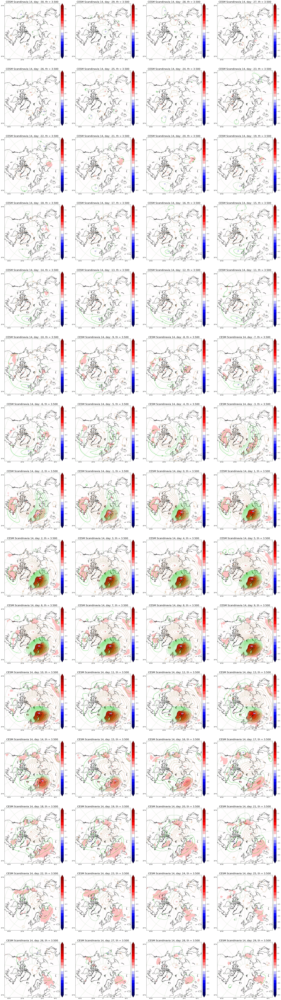

In [15]:
t_value = 2
ts_level = np.linspace(-8.5, 8.5, 18) 
zg_level = np.concatenate((np.arange(-10 * 20, 0, 10), np.arange(10, 10 * 21, 10)))
title_frame = area + '_T' + str(T) + '_' + t2m.filename + '_' + zg500.filename

import matplotlib.gridspec as gridspec
fig2 = plt.figure(figsize=(40, 150))

spec2 = gridspec.GridSpec(ncols=4, nrows=15, figure=fig2)
Nb_frame = 60
for j in range(15):
    for i in range(4):
        ax = fig2.add_subplot(spec2[j,i])
        m = Basemap(projection='nplaea',boundinglat=40,lon_0=0,resolution='c')
        myindex = (i+4*j)
        title_frame = Model+" "+area+" "+str(T)
        print(myindex)
        if myindex < Nb_frame:
            temp_sign, ts_taken = significative_data(t2m.composite_mean[myindex,:,:], t2m.composite_t[myindex,:,:], t_value, False)
            geo_contourf(m, ax, 0, Greenwich(LON), Greenwich(LAT), Greenwich(temp_sign), ts_level, "seismic", title_frame + ', day: ' + str((myindex - Nb_frame//2))+ ', th = %1.3f'%(threshold)) #r = %1.3f'%(xx_rt[return_index]))
            geo_contour_color(m, ax, 0, Greenwich(LON), Greenwich(LAT), t_value, Greenwich(zg500.composite_mean[myindex,:,:]), Greenwich(zg500.composite_t[myindex,:,:]), zg_level, ["sienna","chocolate","green","lime"],["solid","dashed","dashed","solid"],[1,1,1,1])
            PltMaxMinValue(m,Greenwich(LON), Greenwich(LAT), Greenwich(zg500.composite_mean[myindex,:,:]))
            #fig2.savefig("Images/"+Model+"_north_"+area+"_"+str(T)+"_"+str(xx_rt[return_index])+"_"+str((i+4*j)-30)+".png", bbox_inches=full_extent(ax,.25).transformed(fig2.dpi_scale_trans.inverted()))
            fig2.savefig("Images/"+Model+"_north_"+area+"_"+str(T)+"_"+str(threshold)+"_"+str((i+4*j)-30)+".png", bbox_inches=full_extent(ax,.25).transformed(fig2.dpi_scale_trans.inverted()))
#fig2.savefig("Images/CESM_"+area+"_composites.png")

/tmp/ipykernel_3943384/1915682881.py:8: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(width=coords2[2],height=coords2[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords2[0],lon_0=coords2[1])


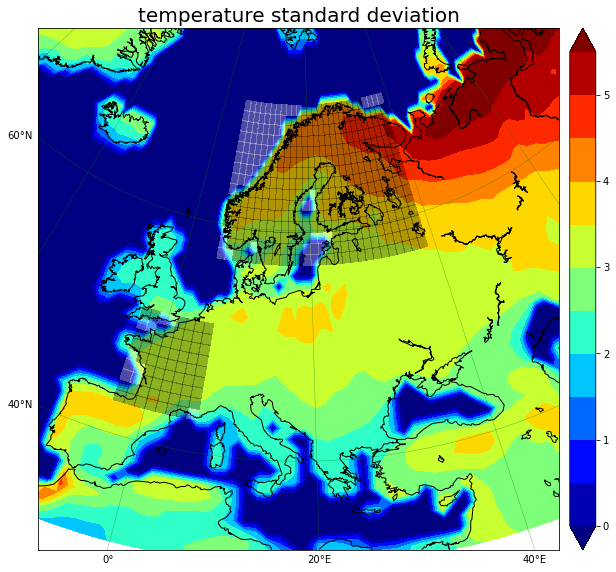

In [16]:
area = 'Scandinavia'
LON_mask = create_mask(Model,area,LON)
LAT_mask = create_mask(Model,area,LAT)
fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(111)
coords2 = [55, 18., 5000000, 5000000]
t2mshape = t2m.var[:,Tot_Mon1[6]:Tot_Mon1[9],:,:].shape
m = Basemap(width=coords2[2],height=coords2[3],resolution='l',projection='aea',lat_ts=60,lat_0=coords2[0],lon_0=coords2[1])
geo_contourf(m, ax, 0, Greenwich(LON), Greenwich(LAT), Greenwich(np.std(t2m.var[:,Tot_Mon1[6]:Tot_Mon1[9],:,:].reshape(t2mshape[0]*t2mshape[1],t2mshape[2],t2mshape[3]),0)), np.arange(0,6,.5), "jet", "temperature standard deviation")
m.pcolormesh((LON_mask), (LAT_mask), (create_mask(Model,area,lsm)), latlon=True, alpha = .3, cmap='binary')
area2 = 'France'
LON_mask2 = create_mask(Model,area2,LON)
LAT_mask2 = create_mask(Model,area2,LAT)
m.pcolormesh((LON_mask2), (LAT_mask2), (create_mask(Model,area2,lsm)), latlon=True, alpha = .3, cmap='binary')
fig.savefig("Images/"+Model+"t2m_std.png")

threshold =  3.5
TSA
A.shape =  (1000, 63)
A_max[0] =  4.306832874638021 Ti[0] =  27
A_max[3] =  4.009131501996654 Ti[3] =  62
A_max[7] =  4.474720066457899 Ti[7] =  7
A_max[15] =  4.552152309018397 Ti[15] =  11
A_max[21] =  5.126576879851453 Ti[21] =  28
A_max[71] =  3.933714026763133 Ti[71] =  51
A_max[75] =  3.661419565229272 Ti[75] =  27
A_max[76] =  4.754628404024231 Ti[76] =  38
A_max[80] =  3.5059712130794933 Ti[80] =  1
A_max[85] =  3.7144246531021414 Ti[85] =  25
A_max[106] =  3.6353086633107 Ti[106] =  56
A_max[109] =  5.192354062152501 Ti[109] =  45
A_max[118] =  4.745237801437172 Ti[118] =  27
A_max[141] =  3.5575132042726545 Ti[141] =  49
A_max[172] =  3.8523786737471646 Ti[172] =  48
A_max[177] =  4.107387954096233 Ti[177] =  6
A_max[188] =  3.58219598700461 Ti[188] =  24
A_max[205] =  4.0359345987362 Ti[205] =  26
A_max[225] =  3.824146778463353 Ti[225] =  1
A_max[230] =  3.8244016107578496 Ti[230] =  33
A_max[231] =  4.0771041153036185 Ti[231] =  31
A_max[243] =  4.4741

/tmp/ipykernel_3943384/4231295046.py:43: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  m = Basemap(projection='nplaea',boundinglat=40,lon_0=0,resolution='c')


30


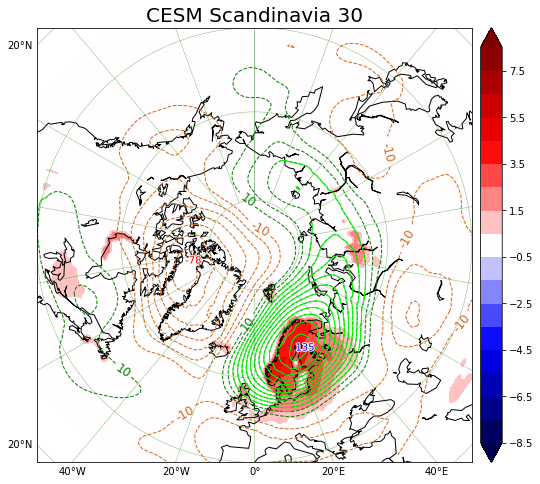

In [17]:
def CompExtremes(series, T, Tot_Mon1, threshold):
    # Computes composites conditioned to extremes of field of duration T based on months provided in Tot_Mon1, the return_index is the index of the return times
    convseq = np.ones(T)/T
    A = np.zeros((series.shape[0], Tot_Mon1[9] - Tot_Mon1[6] - T+1))   # When we use convolve (running mean) there is an extra point that we can generate by displacing the window hence 13 instead of 14
    for y in range(series.shape[0]):
        A[y,:]=np.convolve(series[y,Tot_Mon1[6]:(Tot_Mon1[9])],  convseq, mode='valid')
    print("A.shape = ",A.shape)
    return a_max_and_ti_postproc(A, A.shape[1])

def CompCompositesThreshold(series, myfield, T, Tot_Mon1, threshold):
    A_max, Ti, year_a = CompExtremes(series, T, Tot_Mon1, threshold)
    
    tau = np.arange(-30,30,1)
    nb_events = 0
    myfield.composite_mean = np.zeros((len(tau),myfield.var.shape[2],myfield.var.shape[3]))
    myfield.composite_std = np.zeros((len(tau),myfield.var.shape[2],myfield.var.shape[3]))
    for y in range(series.shape[0]):
        if A_max[y] >= threshold:
            print("A_max["+str(y)+"] = ",A_max[y], "Ti["+str(y)+"] = ", Ti[y])
            nb_events += 1
            value = (myfield.var[y])[tau + (Tot_Mon1[6] + Ti[y]) ]
            myfield.composite_mean += value     # This is the raw sum
            myfield.composite_std += value**2   # This is the raw square sum
    print("number of events: ",nb_events)
    # std and mean are computed below
    myfield.composite_std = np.sqrt((myfield.composite_std - (myfield.composite_mean * myfield.composite_mean / nb_events)) / (nb_events - 1))
    myfield.composite_mean /= nb_events
    myfield.composite_t = (lambda a, b: np.divide(a, b, out=np.zeros(a.shape), where=b != 0))(np.sqrt(nb_events) * myfield.composite_mean, myfield.composite_std)
    

threshold = 3.5
for T in [30]:
    print("threshold = ",threshold)
    for myfield in [t2m, zg500]:
        print(myfield.name)
        CompCompositesThreshold(t2m.abs_area_int, myfield, T, Tot_Mon1, threshold)
t_value = 2
title_frame = area + '_T' + str(T) + '_' + t2m.filename + '_' + zg500.filename

fig2 = plt.figure(figsize=(10, 8))

ax = fig2.add_subplot(1, 1, 1)
m = Basemap(projection='nplaea',boundinglat=40,lon_0=0,resolution='c')
myindex = 30
title_frame = Model+" "+area+" "+str(T)
print(myindex)
temp_sign, ts_taken = significative_data(t2m.composite_mean[myindex,:,:], t2m.composite_t[myindex,:,:], t_value, False)
geo_contourf(m, ax, 0, Greenwich(LON), Greenwich(LAT), Greenwich(temp_sign), ts_level, "seismic", title_frame )
geo_contour_color(m, ax, 0, Greenwich(LON), Greenwich(LAT), t_value, Greenwich(zg500.composite_mean[myindex,:,:]), Greenwich(zg500.composite_t[myindex,:,:]), zg_level, ["sienna","chocolate","green","lime"],["solid","dashed","dashed","solid"],[1,1,1,1])
PltMaxMinValue(m,Greenwich(LON), Greenwich(LAT), Greenwich(zg500.composite_mean[myindex,:,:]))
fig2.savefig("Images/CESM_"+area+"_composites"+str(T)+"_threshold_"+str(threshold)+"_"+str(myindex-30)+"2.png")

threshold =  3.5
TSA
A.shape =  (1000, 63)
A_max[0] =  4.306832874638021 Ti[0] =  26
A_max[3] =  3.834153688471814 Ti[3] =  60
A_max[7] =  4.474720066457899 Ti[7] =  6
A_max[15] =  4.552152309018397 Ti[15] =  10
A_max[21] =  5.126576879851453 Ti[21] =  27
A_max[71] =  3.933714026763133 Ti[71] =  50
A_max[75] =  3.661419565229272 Ti[75] =  26
A_max[76] =  4.754628404024231 Ti[76] =  37
A_max[80] =  3.5059712130794933 Ti[80] =  0
A_max[85] =  3.7144246531021414 Ti[85] =  24
A_max[106] =  3.6353086633107 Ti[106] =  55
A_max[109] =  5.192354062152501 Ti[109] =  44
A_max[118] =  4.745237801437172 Ti[118] =  26
A_max[141] =  3.5575132042726545 Ti[141] =  48
A_max[172] =  3.8523786737471646 Ti[172] =  47
A_max[177] =  4.107387954096233 Ti[177] =  5
A_max[188] =  3.58219598700461 Ti[188] =  23
A_max[205] =  4.0359345987362 Ti[205] =  25
A_max[225] =  3.824146778463353 Ti[225] =  0
A_max[230] =  3.8244016107578496 Ti[230] =  32
A_max[231] =  4.0771041153036185 Ti[231] =  30
A_max[243] =  4.4741

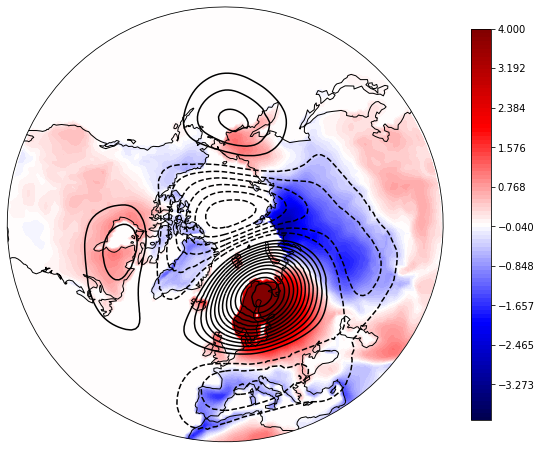

In [20]:
#!/usr/bin/env python3.7

#import sys
#from shutil import copy
#import numpy as np
#import math
#from netCDF4 import Dataset
#import subprocess
#import matplotlib.pyplot as plt
#from matplotlib import cm
#import matplotlib.ticker as mticker
#import pickle
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point
import matplotlib.path as mpath

def CompExtremes(series, T, Tot_Mon1, threshold):
    # Computes composites conditioned to extremes of field of duration T based on months provided in Tot_Mon1, the return_index is the index of the return times
    convseq = np.ones(T)/T
    A = np.zeros((series.shape[0], Tot_Mon1[9] - Tot_Mon1[6] - T+1))   # When we use convolve (running mean) there is an extra point that we can generate by displacing the window hence 13 instead of 14
    for y in range(series.shape[0]):
        A[y,:]=np.convolve(series[y,Tot_Mon1[6]:(Tot_Mon1[9])],  convseq, mode='valid')
    print("A.shape = ",A.shape)
    return a_max_and_ti_postproc(A, A.shape[1])

def CompCompositesThreshold(series, myfield, T, Tot_Mon1, threshold):
    A_max, Ti, year_a = CompExtremes(series, T, Tot_Mon1, threshold)
    
    tau = np.arange(-30,30,1)
    nb_events = 0
    myfield.composite_mean = np.zeros((len(tau),myfield.var.shape[2],myfield.var.shape[3]))
    myfield.composite_std = np.zeros((len(tau),myfield.var.shape[2],myfield.var.shape[3]))
    for y in range(series.shape[0]):
        if A_max[y] >= threshold:
            print("A_max["+str(y)+"] = ",A_max[y], "Ti["+str(y)+"] = ", Ti[y])
            nb_events += 1
            value = (myfield.var[y])[tau + (Tot_Mon1[6] + Ti[y]) ]
            myfield.composite_mean += value     # This is the raw sum
            myfield.composite_std += value**2   # This is the raw square sum
    print("number of events: ",nb_events)
    # std and mean are computed below
    myfield.composite_std = np.sqrt((myfield.composite_std - (myfield.composite_mean * myfield.composite_mean / nb_events)) / (nb_events - 1))
    myfield.composite_mean /= nb_events
    myfield.composite_t = (lambda a, b: np.divide(a, b, out=np.zeros(a.shape), where=b != 0))(np.sqrt(nb_events) * myfield.composite_mean, myfield.composite_std)
    
ts_level = np.linspace(-4, 4, 100)
zg_level = np.concatenate((np.arange(-10 * 20, 0, 10), np.arange(10, 10 * 21, 10))) 
threshold = 3.5
for T in [30]:
    print("threshold = ",threshold)
    for myfield in [t2m, zg500]:
        print(myfield.name)
        CompCompositesThreshold(t2m.abs_area_int, myfield, T, Tot_Mon1, threshold)
t_value = 2
title_frame = area + '_T' + str(T) + '_' + t2m.filename + '_' + zg500.filename

t2mlevels = np.linspace(-4, 4, 100)

for myfield in [t2m, zg500]:
    myfield.temp = np.mean(myfield.composite_mean[range(30,60),:,:],0)
    
#data=ncfile
#datacm=data to be plotted in color map
#datacl=data to be plotted in contour lines

nlon=288
lon = LON[0,:]
lat = LAT[:,0]
datacm_cyclic, lon_cyclic = add_cyclic_point(t2m.temp, coord=lon)
datacl_cyclic, lon_cyclic = add_cyclic_point(zg500.temp, coord=lon)
lons = LON
lats = LAT
lons_cyclic, lats_cyclic = np.meshgrid(lon_cyclic,lat)

#lons=np.concatenate((lons[:,int(nlon/2):nlon+1]-360.0,lons[:,0:int(nlon/2)]),axis=1)
#lats=np.concatenate((lats[:,int(nlon/2):nlon+1],lats[:,0:int(nlon/2)]),axis=1)

fig=plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.NorthPolarStereo())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

plt.contourf(lons_cyclic, lats_cyclic, np.clip(datacm_cyclic, -4, 4), levels=ts_level,cmap='seismic',transform=ccrs.PlateCarree())
cb=plt.colorbar(ax=ax,shrink=0.9); cb.ax.tick_params(labelsize=10) #cb.ax.tick_params(labelsize='smaller')
plt.contour(lons_cyclic, lats_cyclic, datacl_cyclic, levels=zg_level,colors='k',linewidths=1.5,transform=ccrs.PlateCarree())
ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree())
ax.coastlines(linewidth=1)

fig.savefig("Images/"+area+"_3.5.png", bbox_inches='tight') 

In [90]:
LAT[32:43,0]

masked_array(data=[60.78534 , 61.72775 , 62.67016 , 63.612564, 64.55498 ,
                   65.49738 , 66.43979 , 67.3822  , 68.32461 , 69.26701 ,
                   70.20943 ],
             mask=False,
       fill_value=1e+20,
            dtype=float32)

threshold =  3.5
TSA
A.shape =  (1000, 63)
A_max[0] =  4.306832874638021 Ti[0] =  26
A_max[3] =  3.834153688471814 Ti[3] =  60
A_max[7] =  4.474720066457899 Ti[7] =  6
A_max[15] =  4.552152309018397 Ti[15] =  10
A_max[21] =  5.126576879851453 Ti[21] =  27
A_max[71] =  3.933714026763133 Ti[71] =  50
A_max[75] =  3.661419565229272 Ti[75] =  26
A_max[76] =  4.754628404024231 Ti[76] =  37
A_max[80] =  3.5059712130794933 Ti[80] =  0
A_max[85] =  3.7144246531021414 Ti[85] =  24
A_max[106] =  3.6353086633107 Ti[106] =  55
A_max[109] =  5.192354062152501 Ti[109] =  44
A_max[118] =  4.745237801437172 Ti[118] =  26
A_max[141] =  3.5575132042726545 Ti[141] =  48
A_max[172] =  3.8523786737471646 Ti[172] =  47
A_max[177] =  4.107387954096233 Ti[177] =  5
A_max[188] =  3.58219598700461 Ti[188] =  23
A_max[205] =  4.0359345987362 Ti[205] =  25
A_max[225] =  3.824146778463353 Ti[225] =  0
A_max[230] =  3.8244016107578496 Ti[230] =  32
A_max[231] =  4.0771041153036185 Ti[231] =  30
A_max[243] =  4.4741

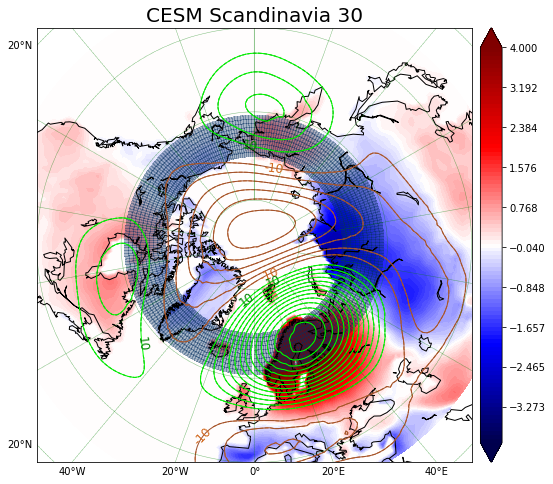

In [91]:
def CompExtremes(series, T, Tot_Mon1, threshold):
    # Computes composites conditioned to extremes of field of duration T based on months provided in Tot_Mon1, the return_index is the index of the return times
    convseq = np.ones(T)/T
    A = np.zeros((series.shape[0], Tot_Mon1[9] - Tot_Mon1[6] - T+1))   # When we use convolve (running mean) there is an extra point that we can generate by displacing the window hence 13 instead of 14
    for y in range(series.shape[0]):
        A[y,:]=np.convolve(series[y,Tot_Mon1[6]:(Tot_Mon1[9])],  convseq, mode='valid')
    print("A.shape = ",A.shape)
    return a_max_and_ti_postproc(A, A.shape[1])

def CompCompositesThreshold(series, myfield, T, Tot_Mon1, threshold):
    A_max, Ti, year_a = CompExtremes(series, T, Tot_Mon1, threshold)
    
    tau = np.arange(-30,30,1)
    nb_events = 0
    myfield.composite_mean = np.zeros((len(tau),myfield.var.shape[2],myfield.var.shape[3]))
    myfield.composite_std = np.zeros((len(tau),myfield.var.shape[2],myfield.var.shape[3]))
    for y in range(series.shape[0]):
        if A_max[y] >= threshold:
            print("A_max["+str(y)+"] = ",A_max[y], "Ti["+str(y)+"] = ", Ti[y])
            nb_events += 1
            value = (myfield.var[y])[tau + (Tot_Mon1[6] + Ti[y]) ]
            myfield.composite_mean += value     # This is the raw sum
            myfield.composite_std += value**2   # This is the raw square sum
    print("number of events: ",nb_events)
    # std and mean are computed below
    myfield.composite_std = np.sqrt((myfield.composite_std - (myfield.composite_mean * myfield.composite_mean / nb_events)) / (nb_events - 1))
    myfield.composite_mean /= nb_events
    myfield.composite_t = (lambda a, b: np.divide(a, b, out=np.zeros(a.shape), where=b != 0))(np.sqrt(nb_events) * myfield.composite_mean, myfield.composite_std)
    
ts_level = np.linspace(-4, 4, 100)
zg_level = np.concatenate((np.arange(-10 * 20, 0, 10), np.arange(10, 10 * 21, 10))) 
threshold = 3.5
for T in [30]:
    print("threshold = ",threshold)
    for myfield in [t2m, zg500]:
        print(myfield.name)
        CompCompositesThreshold(t2m.abs_area_int, myfield, T, Tot_Mon1, threshold)
t_value = 2
title_frame = area + '_T' + str(T) + '_' + t2m.filename + '_' + zg500.filename

fig2 = plt.figure(figsize=(10, 8))

ax = fig2.add_subplot(1, 1, 1)
m = Basemap(projection='nplaea',boundinglat=40,lon_0=0,resolution='c')
myindex = 30
title_frame = Model+" "+area+" "+str(T)
print(myindex)

for myfield in [t2m, zg500]:
    myfield.temp = np.mean(myfield.composite_mean[range(30,60),:,:],0)
    myfield.temp_t = 5*np.ones(myfield.temp.shape)
temp_sign, ts_taken = significative_data(t2m.temp, t2m.temp_t, t_value, False)
geo_contourf(m, ax, 0, Greenwich(LON), Greenwich(LAT), Greenwich(temp_sign), ts_level, "seismic", title_frame )
geo_contour_color(m, ax, 0, Greenwich(LON), Greenwich(LAT), t_value, Greenwich(zg500.temp), Greenwich(zg500.temp_t), zg_level, ["sienna","chocolate","green","lime"],["solid","dashed","dashed","solid"],[1,1,1,1])
m.pcolormesh((LON[32:43,:]), (LAT[32:43,:]), np.ones(LON[32:43,:].shape), latlon=True, alpha = .35, cmap='RdBu_r')
#PltMaxMinValue(m,Greenwich(LON), Greenwich(LAT), Greenwich(zg500.temp))
fig2.savefig("Images/CESM_"+area+"_composites"+str(T)+"_threshold_"+str(threshold)+"_"+str(myindex-30)+".png")

In [78]:
LAT[26:48,0]

masked_array(data=[55.13089 , 56.0733  , 57.015705, 57.958115, 58.900524,
                   59.842934, 60.78534 , 61.72775 , 62.67016 , 63.612564,
                   64.55498 , 65.49738 , 66.43979 , 67.3822  , 68.32461 ,
                   69.26701 , 70.20943 , 71.15183 , 72.09424 , 73.03665 ,
                   73.97906 , 74.92146 ],
             mask=False,
       fill_value=1e+20,
            dtype=float32)

threshold =  3.5
TSA
A.shape =  (1000, 63)
A_max[0] =  4.306832874638021 Ti[0] =  26
0 0
A_max[3] =  3.834153688471814 Ti[3] =  60
0 1
A_max[7] =  4.474720066457899 Ti[7] =  6
0 2
A_max[15] =  4.552152309018396 Ti[15] =  10
0 3
A_max[21] =  5.126576879851453 Ti[21] =  27
0 4
A_max[71] =  3.9337140267631336 Ti[71] =  50
0 5
A_max[75] =  3.661419565229272 Ti[75] =  26
0 6
A_max[76] =  4.754628404024231 Ti[76] =  37
0 7
A_max[80] =  3.505971213079493 Ti[80] =  0
0 8
A_max[85] =  3.714424653102141 Ti[85] =  24
0 9
A_max[106] =  3.6353086633107 Ti[106] =  55
1 0
A_max[109] =  5.192354062152501 Ti[109] =  44
1 1
A_max[118] =  4.745237801437171 Ti[118] =  26
1 2
A_max[141] =  3.5575132042726545 Ti[141] =  48
1 3
A_max[172] =  3.8523786737471646 Ti[172] =  47
1 4
A_max[177] =  4.107387954096233 Ti[177] =  5
1 5
A_max[188] =  3.58219598700461 Ti[188] =  23
1 6
A_max[205] =  4.0359345987362 Ti[205] =  25
1 7
A_max[225] =  3.8241467784633527 Ti[225] =  0
1 8
A_max[230] =  3.8244016107578496 Ti[23

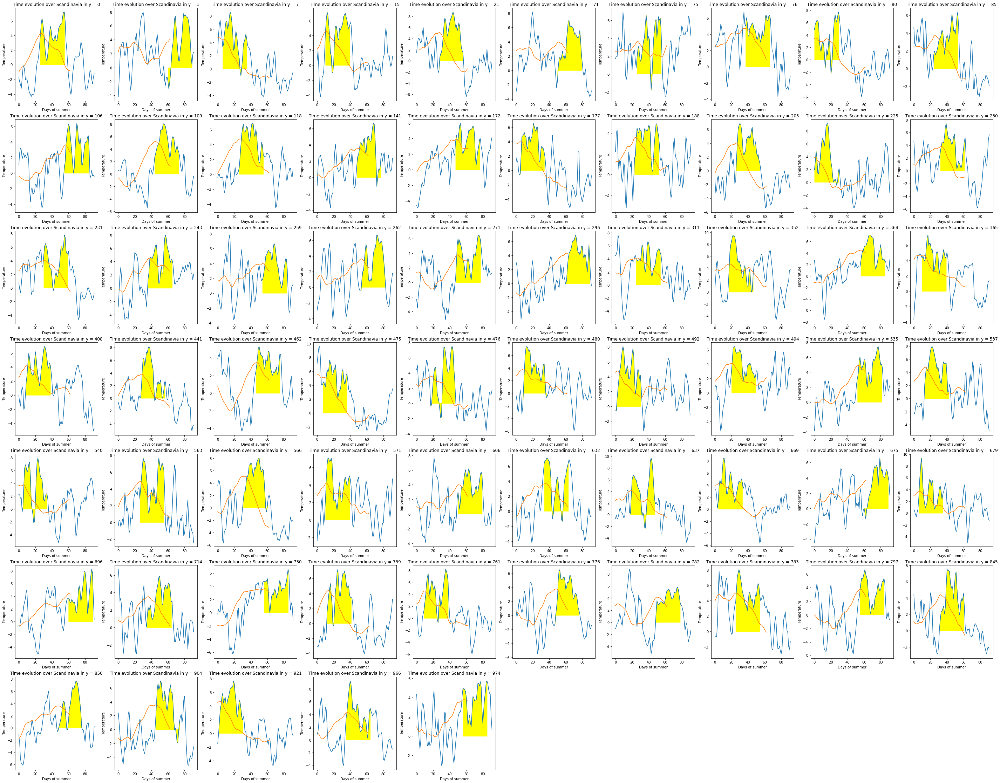

In [94]:
fig2 = plt.figure(figsize=(50, 40))

spec2 = gridspec.GridSpec(ncols=10, nrows=7, figure=fig2)

        
for T in [30]:
    print("threshold = ",threshold)
    for myfield in [t2m]:
        print(myfield.name)
        A_max, Ti, year_a = CompExtremes(t2m.abs_area_int, T, Tot_Mon1, threshold)
        #for y in range(t2m.abs_area_int.shape[0]):
        j = 0
        i = 0
        for y in range(1000):
            if A_max[y] >= threshold:
                print("A_max["+str(y)+"] = ",A_max[y], "Ti["+str(y)+"] = ", Ti[y])
                print(j,i)
                ax = fig2.add_subplot(spec2[j,i])
                i += 1
                if i >= 10:
                    j += 1
                    i = 0
                field_extract = myfield.abs_area_int[:,Tot_Mon1[6]:Tot_Mon1[9]]
                #onset_heatwave = np.argmax(field_extract[])
                objct = "over "+area
                
                plt.fill_between(np.arange(Ti[y], Ti[y]+T), np.zeros(np.arange(Ti[y], Ti[y]+T).shape), field_extract[y,Ti[y]:(Ti[y]+T)],color='yellow')
                plt.plot(field_extract[y],label = 'daily')
                time_avg_field_extract = np.convolve(field_extract[y], np.ones(T)/T, mode='valid')
                plt.plot(time_avg_field_extract,label = str(T)+' d mean')
                plt.title('Time evolution '+objct+' in y = '+str(y))
                plt.xlabel('Days of summer')
                plt.ylabel(myfield.label)
                #plt.legend(loc='best')
fig2.savefig("Images/CESM_"+area+"_time_series.png")

3.693141432679631


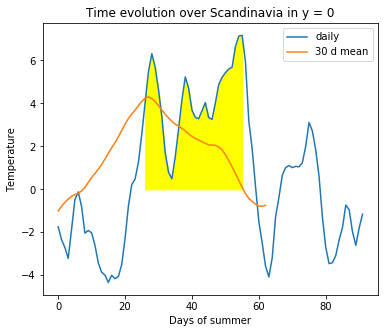

In [68]:

for myfield in [t2m]:
    y = 0
    field_extract = myfield.abs_area_int[:,Tot_Mon1[6]:Tot_Mon1[9]]
    #onset_heatwave = np.argmax(field_extract[])
    objct = "over "+area
    plt.subplot(111)
    plt.fill_between(np.arange(Ti[y], Ti[y]+T), np.zeros(np.arange(Ti[y], Ti[y]+T).shape), field_extract[y,Ti[y]:(Ti[y]+T)],color='yellow')
    plt.plot(field_extract[y],label = 'daily')
    time_avg_field_extract = np.convolve(field_extract[y], np.ones(T)/T, mode='valid')
    plt.plot(time_avg_field_extract,label = str(T)+' d mean')
    plt.title('Time evolution '+objct+' in y = '+str(y))
    plt.xlabel('Days of summer')
    plt.ylabel(myfield.label)
    plt.legend(loc='best')
    print(np.max(time_avg_field_extract[Tot_Mon1[6]:Tot_Mon1[9]]))
    #fig.savefig("Images/detrended_t2m_timeseries_Scandinavia.png")